In [1]:
# Breast Cancer Wisconsin (Diagnostic) Data Set Analysis

## 1. Introduction

# This notebook provides a comprehensive analysis of the Breast Cancer Wisconsin (Diagnostic) Data Set. 
# The analysis includes descriptive statistics, feature scaling, frequency calculations, visualizations,
# two-dimensional frequency tables, conditional distributions, and correlation analysis.


In [307]:
# Load the lib
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from IPython.display import clear_output


In [308]:
# Load the data
data = pd.read_csv('data.csv')

# Display the first few rows of the dataset
data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [309]:
# Display last 5 columns
data.tail()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN
568,92751,B,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,...,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039,NaN


In [310]:
# Display 5 random rows of the data 
data.sample(5)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
455,9112085,B,13.38,30.72,86.34,557.2,0.09245,0.07426,0.02819,0.032640,...,41.61,96.69,705.6,0.1172,0.14210,0.07003,0.07763,0.2196,0.07675,NaN
399,904357,B,11.80,17.26,75.26,431.9,0.09087,0.06232,0.02853,0.016380,...,24.49,86.00,562.0,0.1244,0.17260,0.14490,0.05356,0.2779,0.08121,NaN
171,87163,M,13.43,19.63,85.84,565.4,0.09048,0.06288,0.05858,0.034380,...,29.87,116.60,993.6,0.1401,0.15460,0.26440,0.11600,0.2884,0.07371,NaN
316,894090,B,12.18,14.08,77.25,461.4,0.07734,0.03212,0.01123,0.005051,...,16.47,81.60,513.1,0.1001,0.05332,0.04116,0.01852,0.2293,0.06037,NaN
518,917062,B,12.88,18.22,84.45,493.1,0.12180,0.16610,0.04825,0.053030,...,24.37,99.31,674.7,0.1456,0.29610,0.12460,0.10960,0.2582,0.08893,NaN


In [311]:
# Checking for null values in the data set for data consistency and cleaning
data.isnull()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
565,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
566,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
567,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True


In [312]:
# As we can see most of the columns are not null except for the unnnamed column 32, now lets check for the sum of the true values 
data.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

In [313]:
# Dropping column "Unnamed 32" as its empty and "id " as it will not be needed for further analysis
df_clean = data.drop(columns=['Unnamed: 32','id'])

# Display cleaned data
df_clean.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [314]:
# Distribution of the diagnosis in the dataFrame
df_clean['diagnosis'].value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

In [315]:
#Check for null values in the Data
df_clean.isnull().sum()

diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [316]:
# We divide the clean DataFrame into Categorical and Numerical arrays
cat = []
num = []

# Iterate over the columns in the cleaned data and classify them as categorical and numerical
for column in df_clean.columns:
        if pd.api.types.is_numeric_dtype(df_clean[column]):
            num.append(column)
        else:
            cat.append(column);
            
#Print the Arrays
print("Categorical Array: \n",cat)
print("Numerical Array: \n",num)

Categorical Array: 
 ['diagnosis']
Numerical Array: 
 ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']


<Axes: ylabel='diagnosis'>

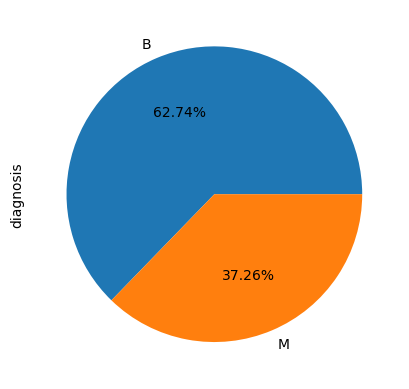

In [317]:
# Generate pieChart to show the distrubition of the catagorical column (diagnosis)
df_clean['diagnosis'].value_counts().plot(kind="pie",autopct="%1.2f%%")

# EDA (Univariate):
IN THIS SECTION WE FIRST DESCRIBE THE DATA WITH THE GIVEN FEATURES AND CALCULATE THE STATISTICAL DATA
MEAN, MEDIAN, MODE, QUARTILES, VARIANCE, STANDARD DEVIATION. WE VISUALIZE THE DATA WITH HELP OF HISTOGRAM AND BOX PLOT TO SEE THE DISTRUBITION OF THE DATA IN THE RESPECTIVE FEATURE


In [318]:
# Basic descriptive and statistics for each column from the cleaned dataFrame, except the column "id"
df_clean.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [319]:
# Median
median_values = df_clean[num].median()

# Mode
mode_values = df_clean[num].mode().iloc[0]

# Quartiles
quartiles = df_clean[num].quantile([0.25, 0.5, 0.75])

# Variance
variance_values = df_clean[num].var()

# Standard Deviation
std_dev_values = df_clean[num].std()

# Print the descriptive statistics
print("\nMedian Values:\n", median_values)
print("\nMode Values:\n", mode_values)
print("\nQuartiles:\n", quartiles)
print("\nVariance Values:\n", variance_values)
print("\nStandard Deviation Values:\n", std_dev_values)


Median Values:
 radius_mean                 13.370000
texture_mean                18.840000
perimeter_mean              86.240000
area_mean                  551.100000
smoothness_mean              0.095870
compactness_mean             0.092630
concavity_mean               0.061540
concave points_mean          0.033500
symmetry_mean                0.179200
fractal_dimension_mean       0.061540
radius_se                    0.324200
texture_se                   1.108000
perimeter_se                 2.287000
area_se                     24.530000
smoothness_se                0.006380
compactness_se               0.020450
concavity_se                 0.025890
concave points_se            0.010930
symmetry_se                  0.018730
fractal_dimension_se         0.003187
radius_worst                14.970000
texture_worst               25.410000
perimeter_worst             97.660000
area_worst                 686.500000
smoothness_worst             0.131300
compactness_worst            0.21

In [36]:
# Descriptive statistics
descriptive_stats = df_clean[num].describe().T
print(descriptive_stats)

                         count        mean         std         min  \
radius_mean              569.0   14.127292    3.524049    6.981000   
texture_mean             569.0   19.289649    4.301036    9.710000   
perimeter_mean           569.0   91.969033   24.298981   43.790000   
area_mean                569.0  654.889104  351.914129  143.500000   
smoothness_mean          569.0    0.096360    0.014064    0.052630   
compactness_mean         569.0    0.104341    0.052813    0.019380   
concavity_mean           569.0    0.088799    0.079720    0.000000   
concave points_mean      569.0    0.048919    0.038803    0.000000   
symmetry_mean            569.0    0.181162    0.027414    0.106000   
fractal_dimension_mean   569.0    0.062798    0.007060    0.049960   
radius_se                569.0    0.405172    0.277313    0.111500   
texture_se               569.0    1.216853    0.551648    0.360200   
perimeter_se             569.0    2.866059    2.021855    0.757000   
area_se             

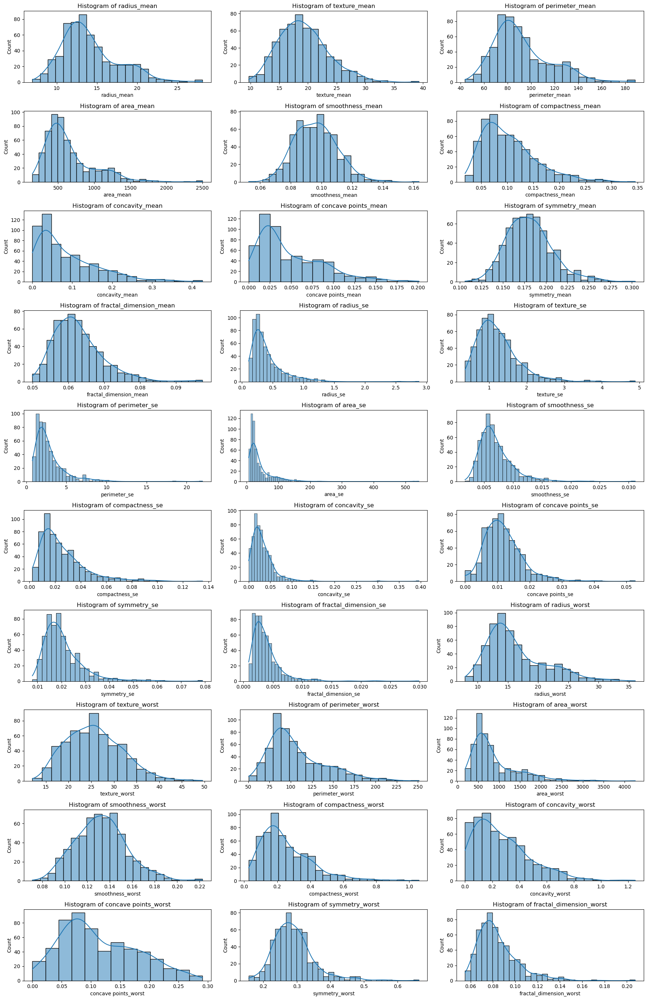

In [365]:
# Histrogram of features

# Set up the figure and subplots
plt.figure(figsize=(18, 30))
plotnumber = 1
num_columns = len(df_clean.columns) - 1  # Exclude 'diagnosis' column
num_rows = (num_columns // 3) + 1  # Calculate the number of rows needed

# Loop through each column except 'diagnosis' to create histograms
for column in df_clean.loc[:, df_clean.columns != 'diagnosis']:
    # Add a subplot in the specified grid shape
    ax = plt.subplot(num_rows, 3, plotnumber)
    sns.histplot(df_clean[column], kde=True)  # adds a line to represent the distrubtion
    plt.xlabel(column)
    plt.title(f'Histogram of {column}')

    plotnumber += 1

# Show graph 
plt.tight_layout()
plt.show()

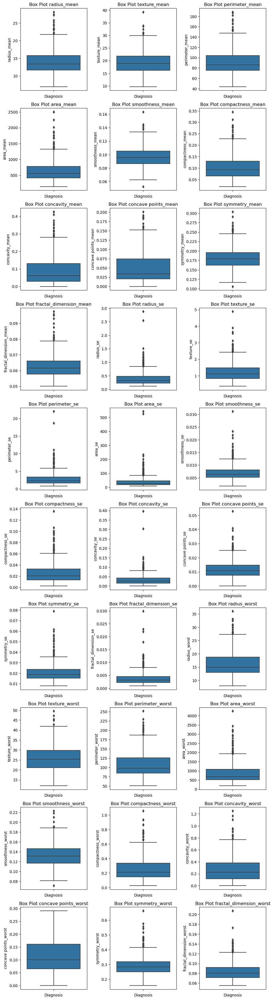

In [128]:
# Set up the figure and subplots
plt.figure(figsize=(10,40))
plotnumber = 1
num_columns = len(df_clean.columns) - 1  # Exclude 'diagnosis' column
num_rows = (num_columns // 3) + 1  # Calculate the number of rows needed

# Loop through each column except 'diagnosis' to create box plots
for column in df_clean.loc[:, df_clean.columns != 'diagnosis']:
    # Add a subplot in the specified grid shape
    ax = plt.subplot(num_rows, 3, plotnumber)
    sns.boxplot( y=column, data=df_clean)  # Box Chart by diagnosis
    plt.xlabel('Diagnosis')
    plt.ylabel(column)
    plt.title(f'Box Plot {column}')

    plotnumber += 1

# Show Graph
plt.tight_layout()
plt.show()

# EDA (Bivariate)

IN THIS SECTION WE GROUP THE DATA IN THREE CATEGORIES: mean_features, se_features, worst_features. THE 10 FEATURES ARE GROUPED WITH THEIR RESPECTIVE CATEGORIES. THE DATA IS THEN ANALYSED WITH RESPECT TO THE DIAGNOSIS AND VISUALIZE THE DATA DISTRIBUTION WITH SCATTER PLOT AND PAIRPLOT. THE CORRELATION MATRIX OF EACH GROUP IS REPRESENTED BY A HEAT MAP

In [64]:
# Standard error features

mean_features = [feature for feature in df_clean.columns if 'mean' in feature]
print(mean_features,"\n")

se_features = [feature for feature in df_clean.columns if 'se' in feature]
print(se_features,"\n")

worst_features = [feature for feature in df_clean.columns if 'worst' in feature]
print(worst_features,"\n")


['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean'] 

['radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se'] 

['radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst'] 



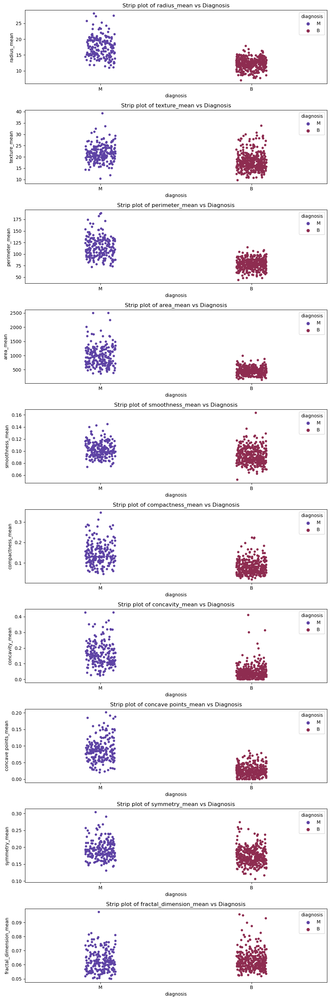

In [82]:
plt.figure(figsize=(10,30))
plotnumber = 1
num_columns = len(df_clean.columns) - 1  
num_rows = (num_columns // 3) + 1  # Calculate the number of rows needed


plotnumber = 1
for feature in mean_features:
    ax = plt.subplot(len(mean_features), 1, plotnumber)
    sns.stripplot(data=df_clean, x='diagnosis', y=feature, palette='twilight', hue=df_clean['diagnosis'])
    plt.title(f'Strip plot of {feature} vs Diagnosis')
    plotnumber += 1
plt.tight_layout()
plt.show()

### Pair Plot to show the distrubtion of data with respect to other grouped features and based on diagnosis

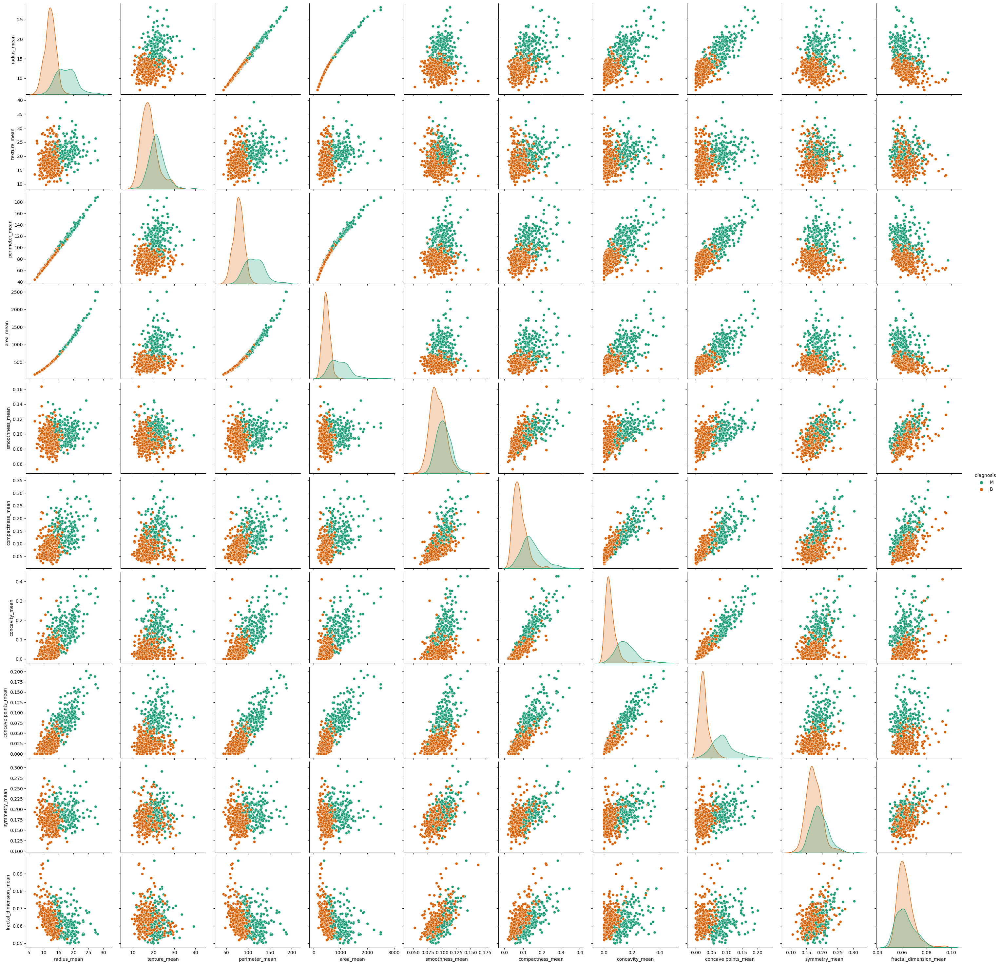

In [96]:
# Pair plot for the 10 features of 'mean' Array

sns.pairplot(df_clean[mean_features+['diagnosis']], hue="diagnosis", palette="Dark2", height=3, aspect=1)
plt.show()

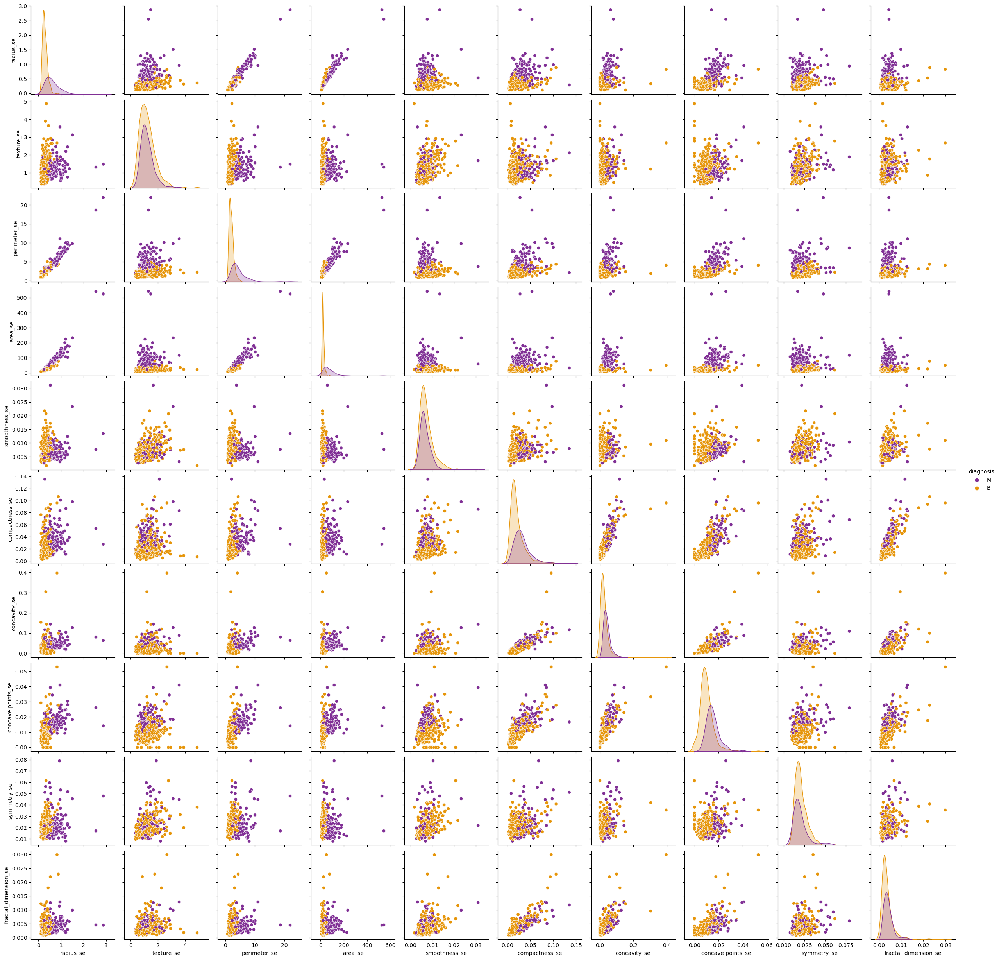

In [94]:
# Pair plot for the 10 features of 'se' Array
sns.pairplot(df_clean[se_features+['diagnosis']], hue="diagnosis", palette="CMRmap")
plt.show()

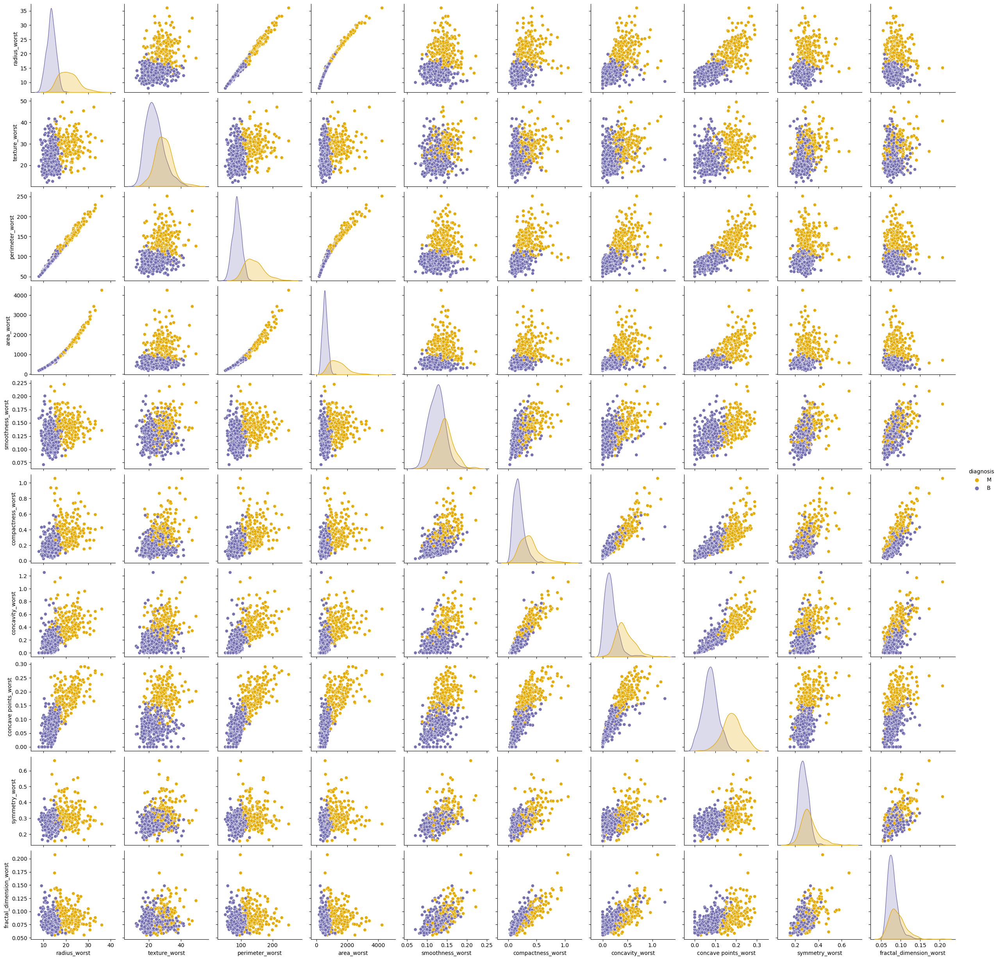

In [92]:
# Pair plot for the 10 features of 'worst' Array
sns.pairplot(df_clean[worst_features+['diagnosis']], hue="diagnosis", palette="Dark2_r")
plt.show()

# Correlation matrix and Heat Maps

In [321]:
# Create a copy of the orginal data frame to convert the diagnosis in numeric values to calculate the correlation matrix
df_num = df_clean.copy()

# Map diagnosis to numerical values
df_num['diagnosis'] = df_num['diagnosis'].map({'M': 1, 'B': 0})

print(df_num)

     diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
0            1        17.99         10.38          122.80     1001.0   
1            1        20.57         17.77          132.90     1326.0   
2            1        19.69         21.25          130.00     1203.0   
3            1        11.42         20.38           77.58      386.1   
4            1        20.29         14.34          135.10     1297.0   
..         ...          ...           ...             ...        ...   
564          1        21.56         22.39          142.00     1479.0   
565          1        20.13         28.25          131.20     1261.0   
566          1        16.60         28.08          108.30      858.1   
567          1        20.60         29.33          140.10     1265.0   
568          0         7.76         24.54           47.92      181.0   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
0            0.11840           0.27760         0.30010  

<Axes: >

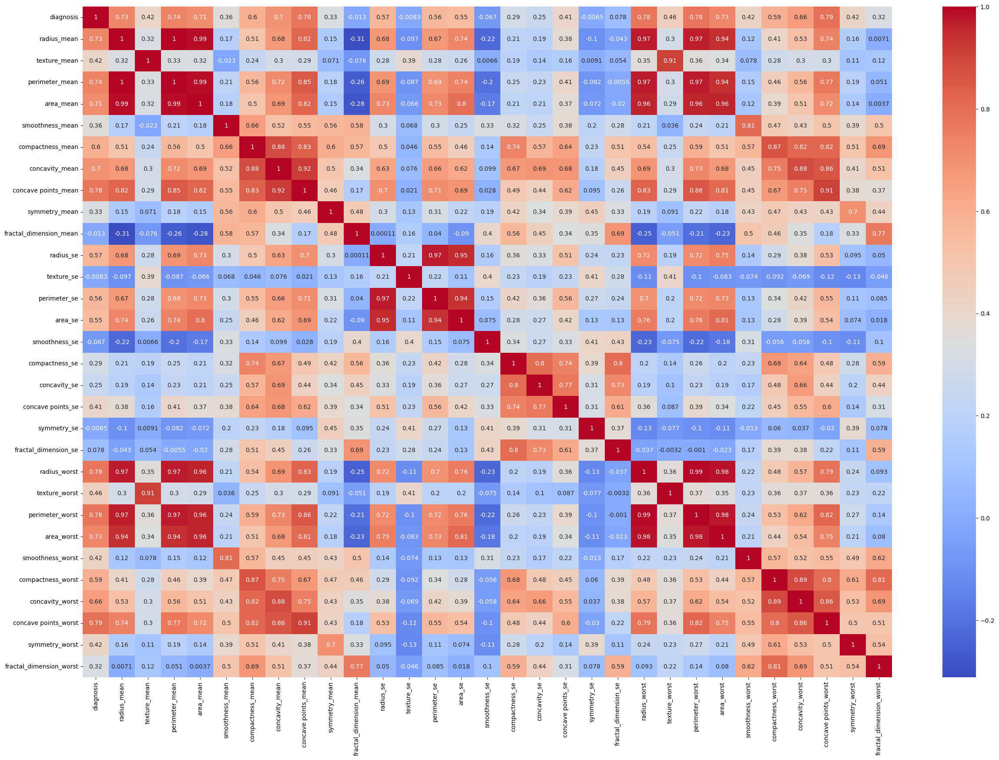

In [363]:
# Calculate the correlation matrix
corr = df_num.corr()

#Visulize the Correaltion with a Heat Map
plt.figure(figsize=(30,20))
sns.heatmap(corr,annot=True,cmap="coolwarm")

# Cluster Analysis

1. Scale data to standardize values
2. Initialize random centroids
3. Get labels for each data point
4. Create new centroids
5. Plot the centroids
6. Loop through the centroids until it stops changing


https://www.youtube.com/watch?v=lX-3nGHDhQg&ab_channel=Dataquest

In [115]:
# Selecting the features for the clusters 
features = ['compactness_se','radius_worst', 'perimeter_mean', 'area_se','texture_mean', 'texture_se',
            'texture_worst','concavity_mean', 'concavity_se', 'concavity_worst', 'concave points_mean',
            'concave points_se','concave points_worst','symmetry_mean', 'symmetry_se', 'symmetry_worst']

In [323]:
df_clean

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [324]:
# Copying the dataframe with the selected features
data_cl = df_clean[features].copy()

### Scaling the data 
In this section we scale or normalise the data in a range of 1-11 so that the columns with higher value dont affect the clusters 

In [325]:
data_cl = ((data_cl - data_cl.min()) / (data_cl.max() - data_cl.min())) * 10 + 1

In [326]:
data_cl.describe()

,compactness_se,radius_worst,perimeter_mean,area_se,texture_mean,texture_se,texture_worst,concavity_mean,concavity_se,concavity_worst,concave points_mean,concave points_se,concave points_worst,symmetry_mean,symmetry_se,symmetry_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,2.744385,3.966627,4.329351,1.626358,4.239651,2.893240,4.639985,3.080584,1.805397,3.174029,3.431369,3.234540,4.938358,4.796054,2.781435,3.633069
std,1.344983,1.719403,1.679150,0.849667,1.454527,1.219166,1.638128,1.867849,0.762274,1.666328,1.928571,1.168836,2.258843,1.384560,1.163164,1.219544
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,1.813230,2.807186,3.168475,1.206351,3.184647,2.046897,3.414712,1.692596,1.381061,1.914537,2.009443,2.446865,3.231271,3.823232,2.024090,2.850976
50%,2.366750,3.504447,3.933453,1.331118,4.087589,2.652670,4.568763,2.441893,1.653788,2.810703,2.665010,3.070468,4.434021,4.696970,2.526425,3.477824
75%,3.268003,4.863394,5.167646,1.716999,5.088603,3.461545,5.717484,4.062324,2.061869,4.058307,4.677932,3.786513,6.546392,5.530303,3.194799,4.181549
max,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000


In [327]:
# Function that creates random clusters. It takes a dataFrame and k as the number of clusters to be generated
# The loop iterates through the data columns and assign a random value to our cluster
def random_centroids(data, k):
    centroids = []
    for _ in range(k):
        centroid = data.apply(lambda x: float(x.sample()))
        centroids.append(centroid)
    return pd.concat(centroids, axis=1)

In [328]:
#Test
centroids = random_centroids(data_cl,2)
centroids

,0,1
compactness_se,1.869559,3.919158
radius_worst,3.689434,3.059765
perimeter_mean,3.284569,9.410614
area_se,1.049234,1.629588
texture_mean,3.505918,2.701048
texture_se,2.427245,1.946782
texture_worst,5.640192,4.227612
concavity_mean,1.064620,1.579897
concavity_se,1.368939,1.551768
concavity_worst,2.551917,1.230351


In [329]:
# This function calculates the distance of the data point from the clusters and labels them based on the centroids

def get_labels(data, centroids):
    distances = centroids.apply(lambda x: np.sqrt(((data - x) ** 2).sum(axis=1)))
    return distances.idxmin(axis=1)

In [330]:
labels = get_labels(data_cl,centroids)

In [331]:
labels

0      0
1      0
2      0
3      0
4      0
      ..
564    0
565    0
566    0
567    0
568    0
Length: 569, dtype: int64

In [332]:
labels.value_counts()

0    555
1     14
dtype: int64

In [333]:
# update cluster
def new_centroids(data, labels, k):
    centroids = data.groupby(labels).apply(lambda x: x.mean()).T
    return centroids

In [349]:
# Plotting the graph and showing the distribution , the cluster centroids are represented by a red dot
def plot_clusters(data, labels, centroids, iteration):
    pca = PCA(n_components=2)
    data_2d = pca.fit_transform(data)
    centroids_2d = pca.transform(centroids.T)
    clear_output(wait=True)
    plt.title(f'Iteration {iteration}')
    plt.scatter(x=data_2d[:, 0], y=data_2d[:, 1], c=labels, cmap="viridis")
    plt.scatter(x=centroids_2d[:, 0], y=centroids_2d[:, 1], c="red")
    plt.show()

# Custom Kmeans Iteration and visulisation

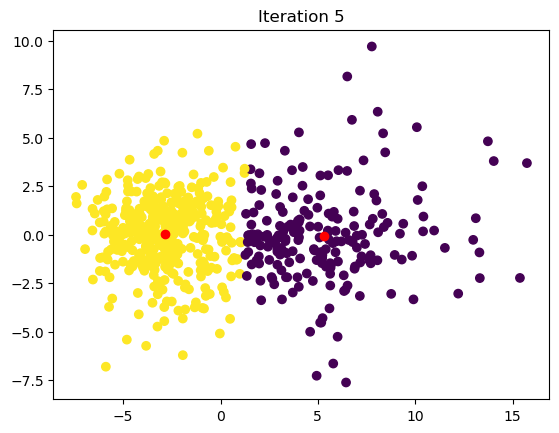

In [369]:
# Main
max_iterations = 100
centroid_count = 2

centroids = random_centroids(data_cl, centroid_count)
old_centroids = pd.DataFrame()
iteration = 1

# Iterate till the number of iterations is less than max_iterations and the centroid stops updating 
while iteration < max_iterations and not centroids.equals(old_centroids):
    old_centroids = centroids
    
    labels = get_labels(data_cl, centroids)
    centroids = new_centroids(data_cl, labels, centroid_count)
    plot_clusters(data_cl, labels, centroids, iteration)
    iteration += 1
    
    
# Final custom centroids and labels
custom_centroids = centroids.T
custom_labels = labels

In [367]:
centroids

,0,1
compactness_se,3.597635,2.296028
radius_worst,5.723426,3.043484
perimeter_mean,5.991249,3.456074
area_se,2.274284,1.285893
texture_mean,4.952072,3.865296
texture_se,2.932153,2.872793
texture_worst,5.504740,4.185583
concavity_mean,5.142776,1.996965
concavity_se,2.267730,1.562455
concavity_worst,4.894393,2.270031


In [356]:
from scipy.optimize import linear_sum_assignment
from sklearn.metrics import confusion_matrix

def map_labels(true_labels, cluster_labels):
    # Create a confusion matrix
    conf_matrix = confusion_matrix(true_labels, cluster_labels)
    
    # Use linear sum assignment to find the best label mapping
    row_ind, col_ind = linear_sum_assignment(-conf_matrix)
    
    # Create a mapping dictionary
    label_mapping = {old_label: new_label for old_label, new_label in zip(col_ind, row_ind)}
    
    # Apply the mapping to the cluster labels
    mapped_labels = [label_mapping[label] for label in cluster_labels]
    
    return mapped_labels

# Map the custom labels to the actual diagnosis labels
mapped_custom_labels = map_labels(df_num['diagnosis'], custom_labels)

print(mapped_custom_labels)

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 

In [357]:
from sklearn.metrics import accuracy_score

# Calculate accuracy (max recorded rating for k=2: 93.32%)
accuracy = accuracy_score(df_num['diagnosis'], mapped_custom_labels) * 100
print(f'Accuracy of the custom K-Means model: {accuracy:.2f} %')


Accuracy of the custom K-Means model: 92.97 %
